### Import Datasets
The dataset is loaded from the specified directory, and the toal number of classes is determined

In [ ]:
import os
images_classes_path = './Extracted_Training_data'
image_classes_list = os.listdir(images_classes_path)
num_classes = len(image_classes_list)
print("total {} classes".format(num_classes))

import cv2 as cv

test_images_path = 'output'
images_dict = {}
image_name_list = os.listdir(test_images_path)
# print(image_name_list)
for image_folder in image_name_list:
    images_dict[image_folder] = []
    images_path = os.path.join(test_images_path, image_folder)
    for image in os.listdir(images_path):
        path_to_coin_image = os.path.join(images_path, image)
        images_dict[image_folder].append(path_to_coin_image)

print(len(images_dict["L0000000"]))
 
num_images = len(image_name_list)
print("total {} test images".format(num_images))

## Data Import and Preprocessing

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard
import datetime
!rm -rf ./logs/

%matplotlib inline
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.metrics import classification_report, confusion_matrix
import tensorflow as tf
import matplotlib.image as mpimg
import numpy as np


## Prerpocessing

In [ ]:

from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
import random

In [ ]:
datagen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range=20,
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.3
)

crazy_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    brightness_range=[0.8, 1.2],
    horizontal_flip=True,
    vertical_flip=True,
    validation_split=0.3
)


train_generator = datagen.flow_from_directory(
    images_classes_path,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=True,
    subset="training"
)

val_generator = datagen.flow_from_directory(
    images_classes_path,
    target_size=(224, 224),
    batch_size=16,
    class_mode='categorical',
    shuffle=False, 
    subset='validation'
)


test_datagen=ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    test_images_path,
    target_size=(224, 224),
    shuffle=False,
    batch_size=1,
    class_mode='categorical'
)

filenames = test_generator.filenames
nb_samples= len(filenames)

x_batch, y_batch = next(train_generator)
print(f"Batch x_shape: {x_batch.shape}, Batch y_shape: {y_batch.shape}")

# Verify the data generators
train_batch = next(iter(train_generator))
val_batch = next(iter(val_generator))
print(train_batch[0].shape, train_batch[1].shape)
print(val_batch[0].shape, val_batch[1].shape)

print(f"Steps per epoch: {train_generator.samples // train_generator.batch_size}")
print(f"Validation steps: {val_generator.samples // val_generator.batch_size}")


## Model configuration

In [ ]:
import keras
from keras.layers import Input
from keras.models import Sequential, Model
from keras.optimizers import SGD, Adam

from keras.layers import Dense, Activation, Dropout, Flatten
from keras.layers import Conv2D
from keras.layers import MaxPooling2D, GlobalAveragePooling2D, BatchNormalization

## Using Inception V3

In [ ]:
from keras.applications.inception_v3 import InceptionV3

In [ ]:
inceptionv3_base = InceptionV3(include_top=False, # Since we will create our own
                    weights='imagenet', 
                    input_shape=(224, 224, 3))
inceptionv3_base.summary()

### Fine-tuning the model

In [ ]:
x = inceptionv3_base.output
x = Flatten()(x)
# x = BatchNormalization()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(rate = .5)(x)
predictions = Dense(num_classes, activation='softmax')(x)

In [ ]:
model = Model(inputs=inceptionv3_base.inputs, outputs=predictions)
model.summary()

### Transfer Learning

In [ ]:
## Freezing in order to only train the last 7 layers
for layer in model.layers[:]:
    layer.trainable = True
for layer in model.layers[:-7]:
    layer.trainable = False
for i, layer in enumerate(model.layers):
    print(i, layer.name, layer.trainable)
model.summary()


In [ ]:
optimizer = Adam(learning_rate=0.0001)
model.compile(optimizer=optimizer,
              loss="categorical_crossentropy",
              metrics=["accuracy"])

## Train the model

In [ ]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import TensorBoard

In [ ]:
checkpoint = ModelCheckpoint('model.keras',
                             monitor='val_acc',
                             verbose=1,
                             save_best_only=True,
                             mode='max')
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
early_stopping_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=6, restore_best_weights=True)


my_callbacks = [checkpoint, tensorboard_callback, early_stopping_callback]

In [ ]:
history = model.fit(train_generator,
          validation_data=val_generator,
          epochs=7,
          callbacks=my_callbacks)
print('Training done!')

In [ ]:
for layer in model.layers[:]:
    layer.trainable = True

In [ ]:
# params = model.fit(train_generator, 
                                # validation_data=val_generator, 
                                # epochs=10,
                                # callbacks=my_callbacks)

In [ ]:

def plot_history(history):
    acc = np.array(history.history['accuracy'])
    val_acc = np.array(history.history['val_accuracy'])
    loss = np.array(history.history['loss'])
    val_loss = np.array(history.history['val_loss'])

    epochs = range(len(acc))

    plt.figure(figsize=(12, 8))

    # Plot training and validation accuracy
    plt.subplot(2, 2, 1)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot training and validation loss
    plt.subplot(2, 2, 2)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    # Plot accuracy
    plt.subplot(2, 2, 3)
    plt.plot(epochs, acc, 'bo-', label='Training accuracy')
    plt.plot(epochs, val_acc, 'ro-', label='Validation accuracy')
    plt.title('Training and validation accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()

    # Plot loss
    plt.subplot(2, 2, 4)
    plt.plot(epochs, loss, 'bo-', label='Training loss')
    plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
    plt.title('Training and validation loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Example usage:
# Assuming 'history' is the History object returned from model.fit
plot_history(history)
plot_history(params)

In [ ]:
%tensorboard --logdir logs/fit

In [ ]:
import os
import time
import subprocess
from IPython.display import display, HTML

os.system('pkill -f "tensorboard"')
subprocess.Popen(["tensorboard", "--logdir", "logs/fit"])
time.sleep(5)
display(HTML(f'<a href="http://localhost:6006" target="_blank">Open TensorBoard</a>'))

## Test model on real images


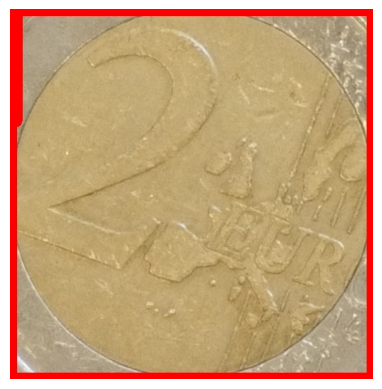

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
Class           Probability
------------------------------
2EUR            : 0.6297
OOD             : 0.2137
0.2EUR          : 0.0472
5CHF            : 0.0243
0.02EUR         : 0.0140
0.5EUR          : 0.0125
0.1CHF          : 0.0109
1CHF            : 0.0102
0.5CHF          : 0.0100
0.05CHF         : 0.0085
2CHF            : 0.0063
0.2CHF          : 0.0047
0.1EUR          : 0.0043
1EUR            : 0.0019
0.05EUR         : 0.0012
0.01EUR         : 0.0005
output\L0000058\coin_2.jpg


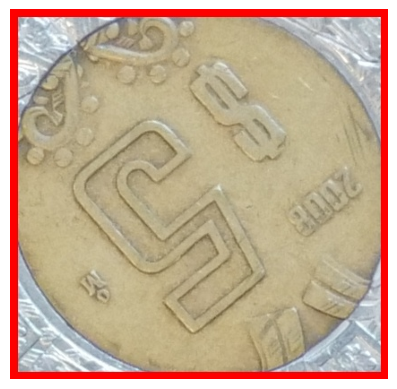

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 173ms/step
Class           Probability
------------------------------
OOD             : 0.9967
5CHF            : 0.0011
0.2EUR          : 0.0011
2EUR            : 0.0005
0.05CHF         : 0.0002
0.02EUR         : 0.0002
2CHF            : 0.0000
1CHF            : 0.0000
0.5EUR          : 0.0000
0.1EUR          : 0.0000
0.5CHF          : 0.0000
0.2CHF          : 0.0000
0.05EUR         : 0.0000
0.1CHF          : 0.0000
1EUR            : 0.0000
0.01EUR         : 0.0000
output\L0000058\coin_3.jpg


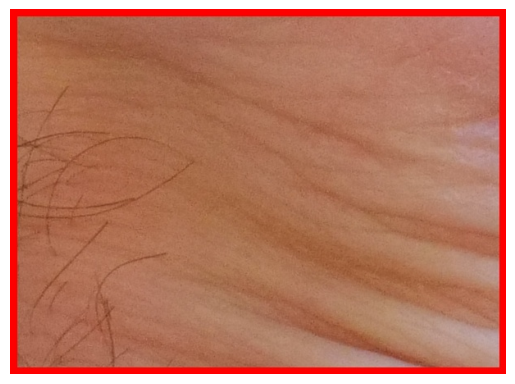

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 192ms/step
Class           Probability
------------------------------
OOD             : 0.4056
2EUR            : 0.2348
0.02EUR         : 0.1148
5CHF            : 0.0500
0.05CHF         : 0.0372
0.5CHF          : 0.0286
0.1CHF          : 0.0229
0.2EUR          : 0.0207
0.1EUR          : 0.0204
1CHF            : 0.0195
1EUR            : 0.0132
0.2CHF          : 0.0098
0.01EUR         : 0.0087
0.05EUR         : 0.0073
0.5EUR          : 0.0050
2CHF            : 0.0017
output\L0000059\coin_0.jpg


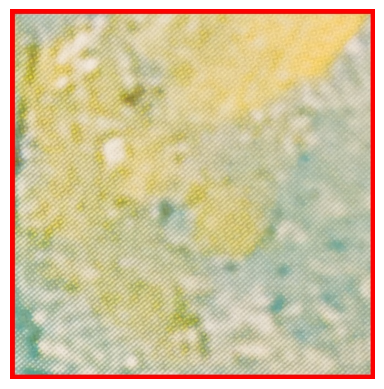

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 281ms/step
Class           Probability
------------------------------
OOD             : 0.2433
0.05CHF         : 0.2166
0.02EUR         : 0.1355
0.1CHF          : 0.0778
2EUR            : 0.0549
5CHF            : 0.0536
1EUR            : 0.0506
0.5CHF          : 0.0366
0.2CHF          : 0.0264
1CHF            : 0.0213
0.5EUR          : 0.0193
2CHF            : 0.0166
0.2EUR          : 0.0158
0.1EUR          : 0.0143
0.01EUR         : 0.0097
0.05EUR         : 0.0076
output\L0000059\coin_1.jpg


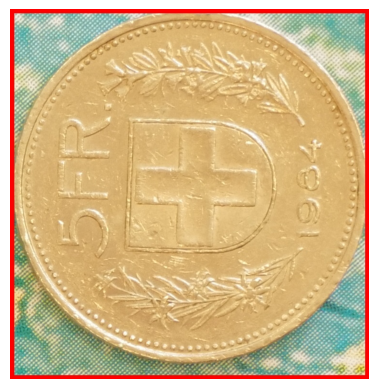

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 243ms/step
Class           Probability
------------------------------
5CHF            : 0.8879
OOD             : 0.0345
0.2EUR          : 0.0299
0.5EUR          : 0.0212
2CHF            : 0.0152
0.2CHF          : 0.0048
1CHF            : 0.0019
2EUR            : 0.0017
0.1EUR          : 0.0011
0.05CHF         : 0.0007
0.1CHF          : 0.0004
0.5CHF          : 0.0003
0.05EUR         : 0.0001
0.02EUR         : 0.0001
1EUR            : 0.0000
0.01EUR         : 0.0000
output\L0000059\coin_10.jpg


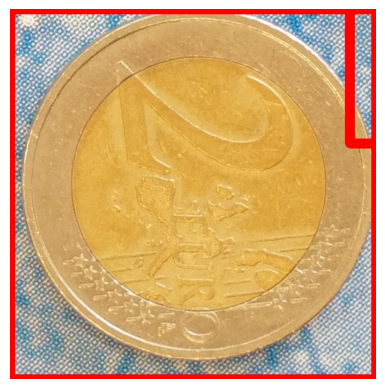

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
Class           Probability
------------------------------
2EUR            : 0.8327
OOD             : 0.0625
0.5EUR          : 0.0232
0.2EUR          : 0.0218
0.02EUR         : 0.0142
2CHF            : 0.0114
0.1CHF          : 0.0101
0.05CHF         : 0.0057
1CHF            : 0.0051
0.5CHF          : 0.0043
0.2CHF          : 0.0042
5CHF            : 0.0034
0.1EUR          : 0.0006
1EUR            : 0.0005
0.05EUR         : 0.0002
0.01EUR         : 0.0000
output\L0000059\coin_11.jpg


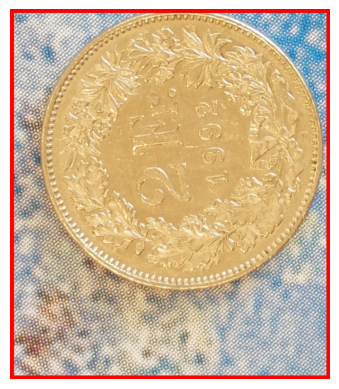

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
Class           Probability
------------------------------
2CHF            : 0.2051
0.2CHF          : 0.1812
0.05CHF         : 0.1675
0.1CHF          : 0.1151
5CHF            : 0.1101
1CHF            : 0.0673
OOD             : 0.0491
0.5EUR          : 0.0342
0.02EUR         : 0.0251
0.2EUR          : 0.0167
0.5CHF          : 0.0160
0.05EUR         : 0.0057
2EUR            : 0.0052
1EUR            : 0.0010
0.1EUR          : 0.0006
0.01EUR         : 0.0002
output\L0000059\coin_12.jpg


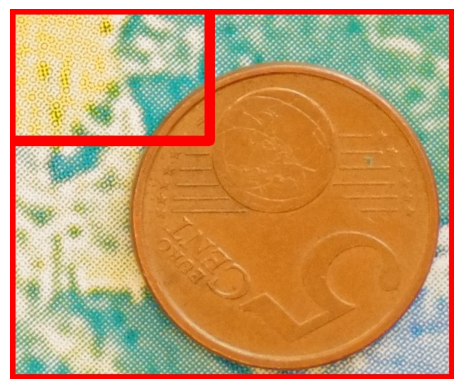

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 223ms/step
Class           Probability
------------------------------
OOD             : 0.8271
0.05EUR         : 0.1183
0.02EUR         : 0.0451
5CHF            : 0.0046
0.2EUR          : 0.0022
0.05CHF         : 0.0008
0.1EUR          : 0.0006
0.5EUR          : 0.0005
0.01EUR         : 0.0003
0.2CHF          : 0.0001
0.1CHF          : 0.0001
1CHF            : 0.0001
2EUR            : 0.0001
1EUR            : 0.0000
2CHF            : 0.0000
0.5CHF          : 0.0000
output\L0000059\coin_13.jpg


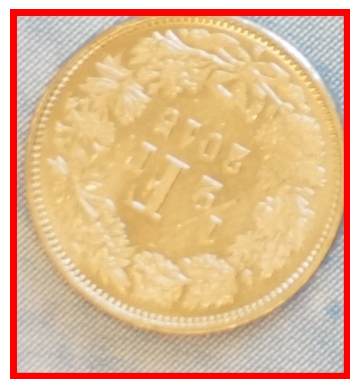

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 157ms/step
Class           Probability
------------------------------
1CHF            : 0.4515
2CHF            : 0.2689
0.5CHF          : 0.1555
2EUR            : 0.0463
0.05CHF         : 0.0402
0.1CHF          : 0.0087
0.5EUR          : 0.0053
5CHF            : 0.0045
0.2CHF          : 0.0044
0.1EUR          : 0.0042
0.2EUR          : 0.0038
1EUR            : 0.0033
OOD             : 0.0020
0.02EUR         : 0.0013
0.01EUR         : 0.0001
0.05EUR         : 0.0001
output\L0000059\coin_14.jpg


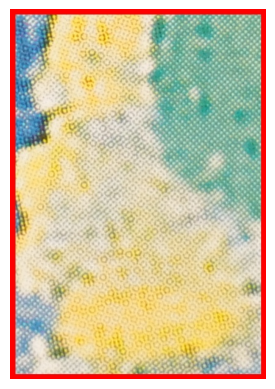

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 143ms/step
Class           Probability
------------------------------
OOD             : 0.2215
0.05CHF         : 0.2110
1EUR            : 0.1551
0.1CHF          : 0.1361
5CHF            : 0.0781
0.02EUR         : 0.0567
0.5CHF          : 0.0226
0.2EUR          : 0.0219
2EUR            : 0.0218
0.1EUR          : 0.0175
1CHF            : 0.0140
0.01EUR         : 0.0131
0.2CHF          : 0.0123
0.5EUR          : 0.0116
0.05EUR         : 0.0047
2CHF            : 0.0020
output\L0000059\coin_2.jpg


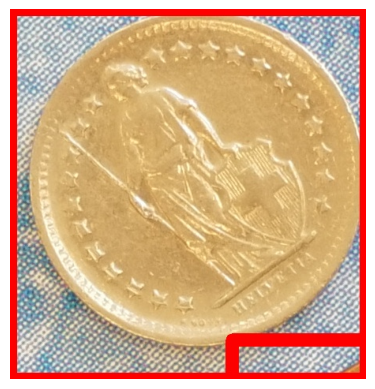

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 328ms/step
Class           Probability
------------------------------
0.5CHF          : 0.5118
1CHF            : 0.2761
0.2CHF          : 0.1003
OOD             : 0.0344
2EUR            : 0.0203
2CHF            : 0.0201
0.2EUR          : 0.0154
5CHF            : 0.0084
0.1CHF          : 0.0050
0.1EUR          : 0.0032
0.5EUR          : 0.0015
0.02EUR         : 0.0013
1EUR            : 0.0010
0.01EUR         : 0.0009
0.05CHF         : 0.0004
0.05EUR         : 0.0001
output\L0000059\coin_3.jpg


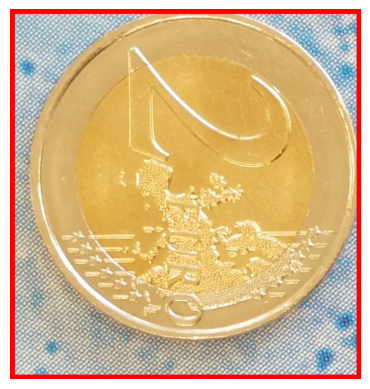

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 229ms/step
Class           Probability
------------------------------
2EUR            : 0.9246
OOD             : 0.0259
5CHF            : 0.0130
0.5EUR          : 0.0086
1EUR            : 0.0055
0.02EUR         : 0.0055
1CHF            : 0.0037
0.5CHF          : 0.0030
0.1CHF          : 0.0029
0.05CHF         : 0.0027
0.2EUR          : 0.0016
0.2CHF          : 0.0012
0.1EUR          : 0.0009
2CHF            : 0.0008
0.05EUR         : 0.0001
0.01EUR         : 0.0000
output\L0000059\coin_4.jpg


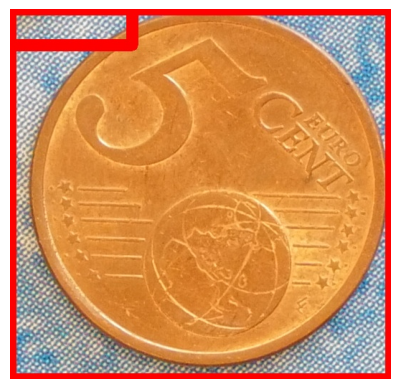

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 167ms/step
Class           Probability
------------------------------
0.02EUR         : 0.5829
0.05EUR         : 0.2574
0.01EUR         : 0.1438
0.5EUR          : 0.0071
0.2EUR          : 0.0035
0.1EUR          : 0.0015
OOD             : 0.0014
1CHF            : 0.0005
1EUR            : 0.0004
0.05CHF         : 0.0004
0.1CHF          : 0.0004
0.2CHF          : 0.0004
0.5CHF          : 0.0002
2EUR            : 0.0001
2CHF            : 0.0001
5CHF            : 0.0000
output\L0000059\coin_5.jpg


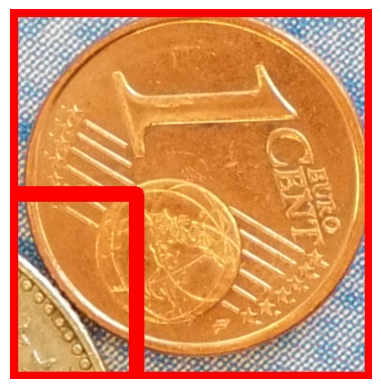

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 337ms/step
Class           Probability
------------------------------
0.02EUR         : 0.5382
0.01EUR         : 0.3380
2EUR            : 0.0457
OOD             : 0.0453
0.05EUR         : 0.0138
1EUR            : 0.0060
0.1EUR          : 0.0031
0.2EUR          : 0.0028
0.05CHF         : 0.0018
5CHF            : 0.0017
1CHF            : 0.0015
0.5CHF          : 0.0013
0.5EUR          : 0.0004
0.1CHF          : 0.0002
2CHF            : 0.0002
0.2CHF          : 0.0001
output\L0000059\coin_6.jpg


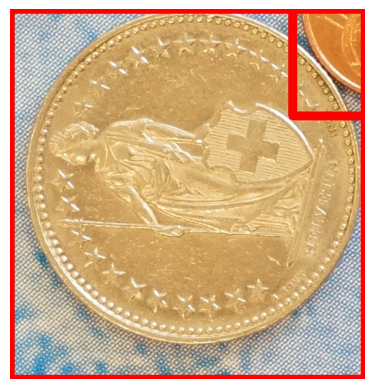

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
Class           Probability
------------------------------
0.5CHF          : 0.5379
1CHF            : 0.1411
5CHF            : 0.1288
2CHF            : 0.0786
0.2CHF          : 0.0496
0.1CHF          : 0.0228
OOD             : 0.0149
2EUR            : 0.0074
0.2EUR          : 0.0058
0.05CHF         : 0.0049
0.02EUR         : 0.0045
0.5EUR          : 0.0018
0.1EUR          : 0.0007
1EUR            : 0.0005
0.05EUR         : 0.0005
0.01EUR         : 0.0002
output\L0000059\coin_7.jpg


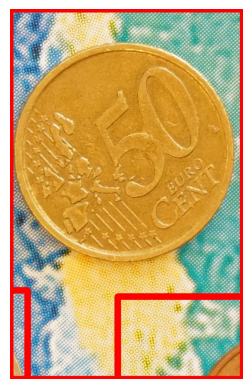

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 156ms/step
Class           Probability
------------------------------
0.5EUR          : 0.4844
OOD             : 0.1202
2CHF            : 0.1144
0.1EUR          : 0.1039
0.2EUR          : 0.0917
2EUR            : 0.0486
0.02EUR         : 0.0139
0.05EUR         : 0.0065
0.2CHF          : 0.0054
5CHF            : 0.0033
0.05CHF         : 0.0030
1CHF            : 0.0022
0.1CHF          : 0.0010
0.5CHF          : 0.0008
1EUR            : 0.0003
0.01EUR         : 0.0003
output\L0000059\coin_8.jpg


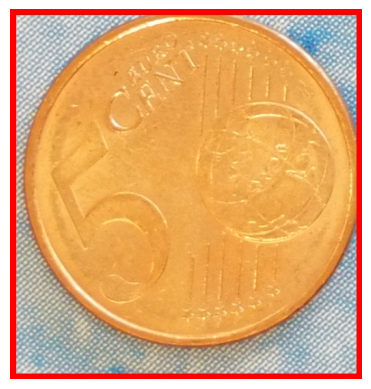

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 119ms/step
Class           Probability
------------------------------
0.02EUR         : 0.6356
0.05EUR         : 0.1841
0.5EUR          : 0.1258
0.2EUR          : 0.0162
OOD             : 0.0078
0.1CHF          : 0.0063
0.01EUR         : 0.0059
0.05CHF         : 0.0053
2EUR            : 0.0031
0.2CHF          : 0.0020
5CHF            : 0.0020
0.1EUR          : 0.0020
0.5CHF          : 0.0013
2CHF            : 0.0011
1CHF            : 0.0010
1EUR            : 0.0006
output\L0000059\coin_9.jpg


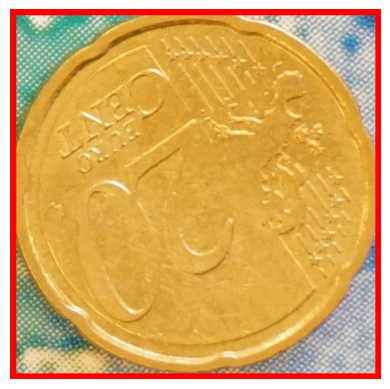

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
Class           Probability
------------------------------
0.2EUR          : 0.5257
0.5EUR          : 0.2297
0.1EUR          : 0.1595
2EUR            : 0.0466
OOD             : 0.0184
2CHF            : 0.0099
0.02EUR         : 0.0030
1CHF            : 0.0017
0.1CHF          : 0.0013
0.05EUR         : 0.0011
0.2CHF          : 0.0010
0.5CHF          : 0.0007
5CHF            : 0.0005
1EUR            : 0.0005
0.05CHF         : 0.0004
0.01EUR         : 0.0002
output\L0000060\coin_0.jpg


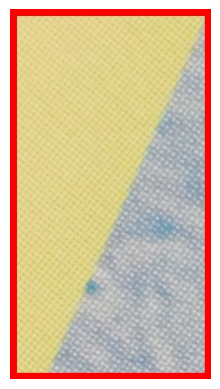

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
Class           Probability
------------------------------
OOD             : 0.4646
5CHF            : 0.1731
0.02EUR         : 0.1048
2EUR            : 0.0552
0.05CHF         : 0.0425
0.5CHF          : 0.0314
1EUR            : 0.0234
0.1EUR          : 0.0213
1CHF            : 0.0201
0.5EUR          : 0.0140
0.05EUR         : 0.0103
0.2CHF          : 0.0103
0.2EUR          : 0.0087
0.1CHF          : 0.0085
0.01EUR         : 0.0073
2CHF            : 0.0045
output\L0000060\coin_1.jpg


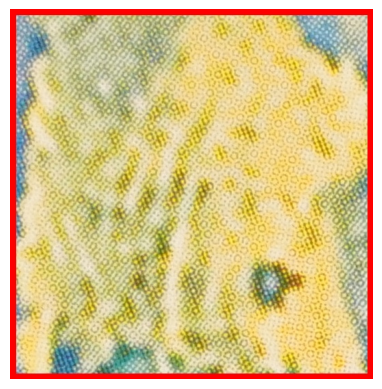

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
Class           Probability
------------------------------
0.05CHF         : 0.3493
0.5CHF          : 0.1284
0.1CHF          : 0.1126
OOD             : 0.0954
5CHF            : 0.0712
1EUR            : 0.0549
2EUR            : 0.0436
0.02EUR         : 0.0432
1CHF            : 0.0415
0.1EUR          : 0.0155
0.2CHF          : 0.0122
0.01EUR         : 0.0093
0.5EUR          : 0.0085
2CHF            : 0.0057
0.2EUR          : 0.0045
0.05EUR         : 0.0040
output\L0000060\coin_10.jpg


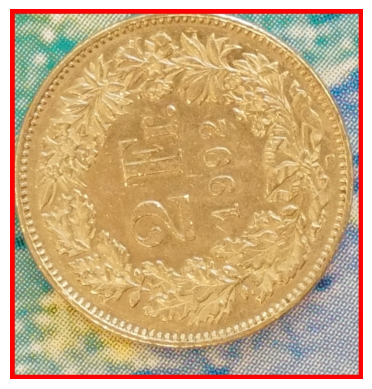

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 251ms/step
Class           Probability
------------------------------
0.2CHF          : 0.4370
2CHF            : 0.2557
0.1CHF          : 0.1752
1CHF            : 0.0467
0.5CHF          : 0.0263
0.05CHF         : 0.0167
0.5EUR          : 0.0156
5CHF            : 0.0094
OOD             : 0.0080
0.02EUR         : 0.0034
0.2EUR          : 0.0032
2EUR            : 0.0015
0.05EUR         : 0.0006
1EUR            : 0.0004
0.1EUR          : 0.0001
0.01EUR         : 0.0000
output\L0000060\coin_2.jpg


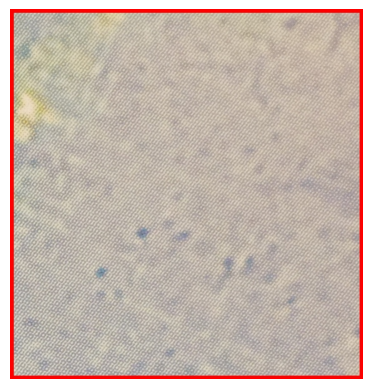

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 208ms/step
Class           Probability
------------------------------
0.02EUR         : 0.2434
OOD             : 0.2230
0.05CHF         : 0.0869
2EUR            : 0.0632
0.5CHF          : 0.0605
1EUR            : 0.0581
5CHF            : 0.0474
1CHF            : 0.0463
0.1CHF          : 0.0393
0.2CHF          : 0.0317
2CHF            : 0.0272
0.2EUR          : 0.0220
0.1EUR          : 0.0201
0.01EUR         : 0.0147
0.5EUR          : 0.0100
0.05EUR         : 0.0061
output\L0000060\coin_3.jpg


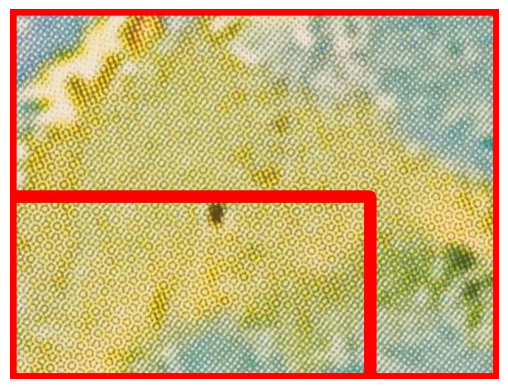

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 232ms/step
Class           Probability
------------------------------
OOD             : 0.4843
5CHF            : 0.1862
0.05CHF         : 0.1677
0.02EUR         : 0.0538
2EUR            : 0.0342
1CHF            : 0.0211
1EUR            : 0.0144
0.1CHF          : 0.0084
0.5CHF          : 0.0075
0.2EUR          : 0.0057
0.1EUR          : 0.0054
0.01EUR         : 0.0027
0.5EUR          : 0.0026
0.2CHF          : 0.0023
2CHF            : 0.0020
0.05EUR         : 0.0016
output\L0000060\coin_4.jpg


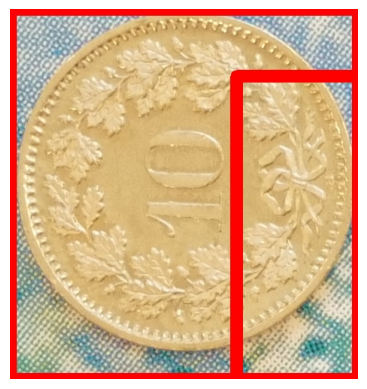

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 363ms/step
Class           Probability
------------------------------
OOD             : 0.3017
0.2CHF          : 0.2480
2EUR            : 0.1338
0.1CHF          : 0.0950
0.5CHF          : 0.0837
1CHF            : 0.0684
0.2EUR          : 0.0243
0.05CHF         : 0.0182
0.02EUR         : 0.0131
2CHF            : 0.0059
5CHF            : 0.0054
1EUR            : 0.0010
0.5EUR          : 0.0006
0.1EUR          : 0.0004
0.05EUR         : 0.0003
0.01EUR         : 0.0000
output\L0000060\coin_5.jpg


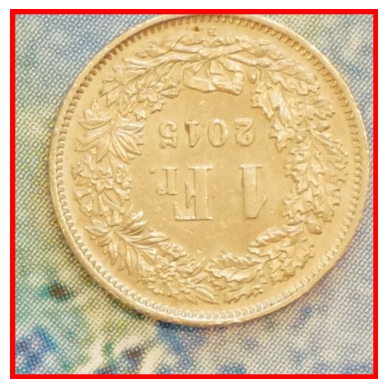

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
Class           Probability
------------------------------
2CHF            : 0.5823
1CHF            : 0.1382
2EUR            : 0.0554
0.2CHF          : 0.0509
0.5EUR          : 0.0400
0.1CHF          : 0.0377
5CHF            : 0.0326
0.5CHF          : 0.0304
0.05CHF         : 0.0153
0.2EUR          : 0.0103
OOD             : 0.0036
0.02EUR         : 0.0010
1EUR            : 0.0010
0.1EUR          : 0.0008
0.05EUR         : 0.0004
0.01EUR         : 0.0001
output\L0000060\coin_6.jpg


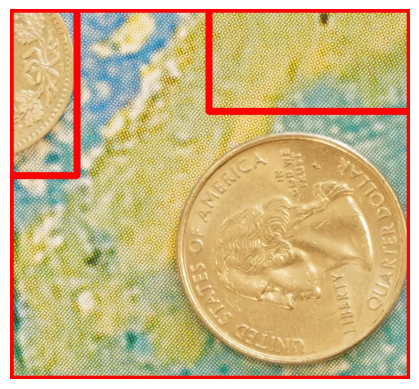

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 331ms/step
Class           Probability
------------------------------
OOD             : 0.5759
0.5EUR          : 0.1796
0.2CHF          : 0.0936
5CHF            : 0.0310
0.1CHF          : 0.0307
0.02EUR         : 0.0172
2EUR            : 0.0156
0.1EUR          : 0.0136
0.05CHF         : 0.0109
0.05EUR         : 0.0076
0.2EUR          : 0.0061
0.5CHF          : 0.0052
1EUR            : 0.0047
1CHF            : 0.0047
2CHF            : 0.0022
0.01EUR         : 0.0015
output\L0000060\coin_7.jpg


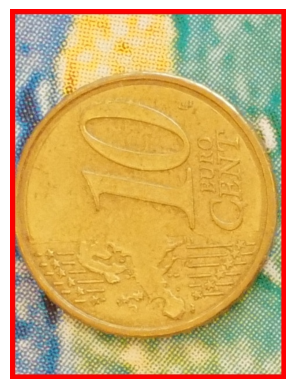

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 282ms/step
Class           Probability
------------------------------
0.5EUR          : 0.6619
0.2EUR          : 0.1246
OOD             : 0.1202
2EUR            : 0.0458
5CHF            : 0.0220
0.02EUR         : 0.0068
0.1EUR          : 0.0061
0.05CHF         : 0.0055
2CHF            : 0.0023
0.05EUR         : 0.0018
0.1CHF          : 0.0009
1CHF            : 0.0008
0.2CHF          : 0.0007
0.5CHF          : 0.0005
1EUR            : 0.0001
0.01EUR         : 0.0000
output\L0000060\coin_8.jpg


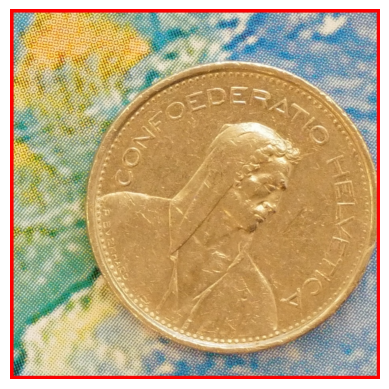

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 257ms/step
Class           Probability
------------------------------
5CHF            : 0.2961
OOD             : 0.2222
0.5CHF          : 0.1356
0.2CHF          : 0.1179
0.5EUR          : 0.0625
0.1CHF          : 0.0421
1CHF            : 0.0288
0.02EUR         : 0.0283
2EUR            : 0.0159
0.1EUR          : 0.0135
0.05EUR         : 0.0120
0.2EUR          : 0.0102
0.01EUR         : 0.0063
2CHF            : 0.0049
0.05CHF         : 0.0022
1EUR            : 0.0015
output\L0000060\coin_9.jpg


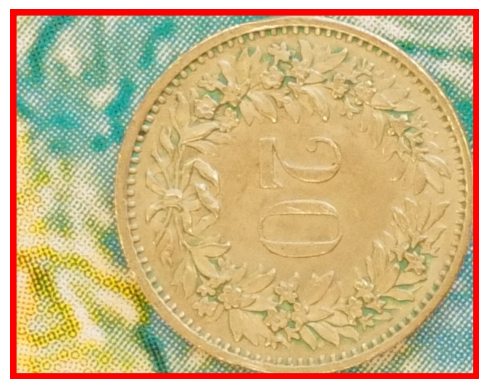

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
Class           Probability
------------------------------
0.1CHF          : 0.4703
0.2CHF          : 0.2557
0.05CHF         : 0.1069
0.5EUR          : 0.0325
2CHF            : 0.0282
5CHF            : 0.0270
OOD             : 0.0173
2EUR            : 0.0173
0.02EUR         : 0.0141
0.5CHF          : 0.0117
1CHF            : 0.0090
0.2EUR          : 0.0073
0.05EUR         : 0.0014
1EUR            : 0.0011
0.1EUR          : 0.0002
0.01EUR         : 0.0000
output\L0000061\coin_0.jpg


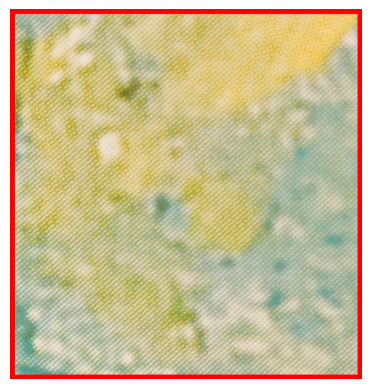

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
Class           Probability
------------------------------
OOD             : 0.2605
0.05CHF         : 0.1490
0.02EUR         : 0.1228
2EUR            : 0.0828
0.1CHF          : 0.0590
1EUR            : 0.0586
0.5CHF          : 0.0523
5CHF            : 0.0365
0.5EUR          : 0.0319
0.2CHF          : 0.0298
1CHF            : 0.0285
0.1EUR          : 0.0278
2CHF            : 0.0237
0.2EUR          : 0.0204
0.01EUR         : 0.0097
0.05EUR         : 0.0067
output\L0000061\coin_1.jpg


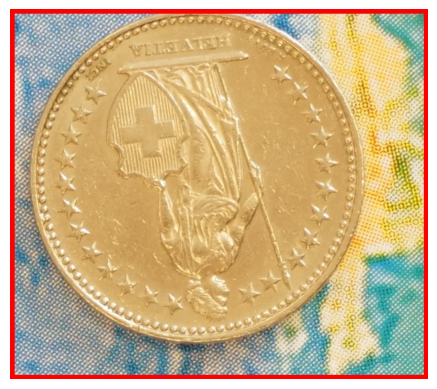

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
Class           Probability
------------------------------
1CHF            : 0.2332
0.5CHF          : 0.2209
2CHF            : 0.1624
0.2CHF          : 0.1285
0.1CHF          : 0.0673
5CHF            : 0.0659
OOD             : 0.0329
2EUR            : 0.0314
0.2EUR          : 0.0220
0.5EUR          : 0.0165
0.02EUR         : 0.0106
0.1EUR          : 0.0028
0.05CHF         : 0.0028
0.05EUR         : 0.0010
1EUR            : 0.0010
0.01EUR         : 0.0007
output\L0000061\coin_2.jpg


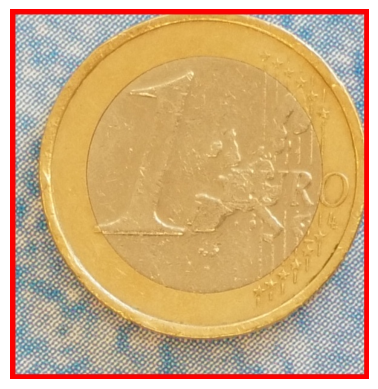

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
Class           Probability
------------------------------
2EUR            : 0.5714
1EUR            : 0.2094
OOD             : 0.0551
0.5CHF          : 0.0551
0.5EUR          : 0.0356
5CHF            : 0.0140
1CHF            : 0.0139
0.1EUR          : 0.0100
0.1CHF          : 0.0079
0.2CHF          : 0.0075
2CHF            : 0.0067
0.02EUR         : 0.0048
0.2EUR          : 0.0037
0.05CHF         : 0.0028
0.01EUR         : 0.0019
0.05EUR         : 0.0003
output\L0000061\coin_3.jpg


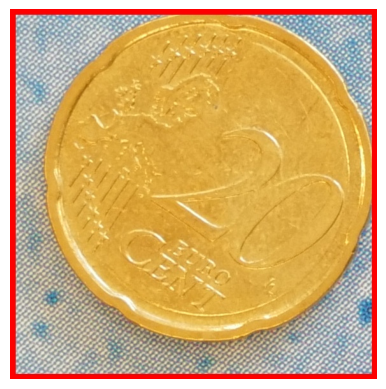

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
Class           Probability
------------------------------
0.2EUR          : 0.5333
0.05EUR         : 0.1443
0.1EUR          : 0.1282
0.02EUR         : 0.0736
0.5EUR          : 0.0628
OOD             : 0.0300
2EUR            : 0.0077
0.2CHF          : 0.0062
0.01EUR         : 0.0039
1CHF            : 0.0030
2CHF            : 0.0021
0.1CHF          : 0.0020
5CHF            : 0.0011
0.5CHF          : 0.0008
0.05CHF         : 0.0008
1EUR            : 0.0002
output\L0000061\coin_4.jpg


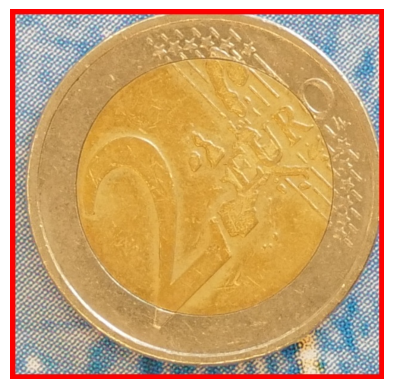

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
Class           Probability
------------------------------
2EUR            : 0.9648
0.2EUR          : 0.0247
OOD             : 0.0059
0.5EUR          : 0.0018
2CHF            : 0.0012
0.5CHF          : 0.0003
1CHF            : 0.0003
0.2CHF          : 0.0003
0.02EUR         : 0.0003
0.1EUR          : 0.0002
0.1CHF          : 0.0002
0.05CHF         : 0.0000
5CHF            : 0.0000
1EUR            : 0.0000
0.05EUR         : 0.0000
0.01EUR         : 0.0000
output\L0000061\coin_5.jpg


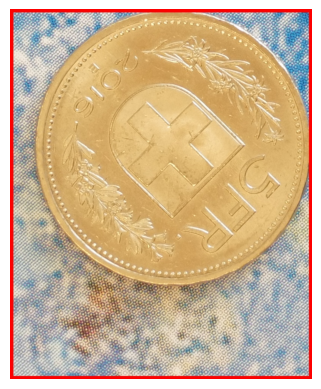

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
Class           Probability
------------------------------
5CHF            : 0.8988
OOD             : 0.0619
1CHF            : 0.0107
2CHF            : 0.0071
0.2EUR          : 0.0061
2EUR            : 0.0045
0.5CHF          : 0.0036
0.5EUR          : 0.0018
0.1EUR          : 0.0016
0.1CHF          : 0.0015
0.2CHF          : 0.0009
0.02EUR         : 0.0008
0.05CHF         : 0.0005
0.05EUR         : 0.0002
1EUR            : 0.0001
0.01EUR         : 0.0000
output\L0000061\coin_6.jpg


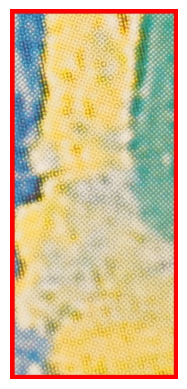

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
Class           Probability
------------------------------
0.05CHF         : 0.3567
5CHF            : 0.1593
0.1CHF          : 0.1204
0.02EUR         : 0.0759
OOD             : 0.0683
0.5CHF          : 0.0573
1EUR            : 0.0435
1CHF            : 0.0428
0.2CHF          : 0.0149
0.1EUR          : 0.0142
0.05EUR         : 0.0139
0.01EUR         : 0.0114
2EUR            : 0.0097
0.5EUR          : 0.0051
0.2EUR          : 0.0050
2CHF            : 0.0017
output\L0000062\coin_0.jpg


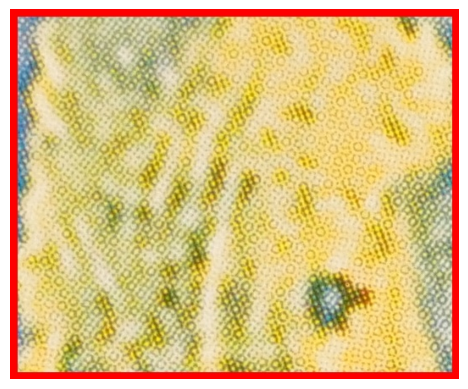

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 209ms/step
Class           Probability
------------------------------
0.05CHF         : 0.2664
OOD             : 0.1975
5CHF            : 0.1393
1CHF            : 0.1124
0.1CHF          : 0.0647
0.5CHF          : 0.0584
1EUR            : 0.0367
2EUR            : 0.0363
0.02EUR         : 0.0342
0.2CHF          : 0.0122
2CHF            : 0.0120
0.2EUR          : 0.0106
0.1EUR          : 0.0090
0.5EUR          : 0.0045
0.05EUR         : 0.0032
0.01EUR         : 0.0026
output\L0000062\coin_1.jpg


KeyboardInterrupt: 

In [19]:
def predict_images(path):
    # Load and display the image
    img = mpimg.imread(path)
    plt.imshow(img)
    plt.axis('off')  # Hide axis
    plt.show()

    # Preprocess the image
    image = Image.open(path)
    image = image.convert('RGB')
    image = image.resize((224, 224))
    image = np.array(image) / 255.0  # Normalize the image
    image = np.expand_dims(image, axis=0)  # Expand dimensions to fit model input

    # Predict the probabilities
    probabilities = model.predict(image)

    # Get class labels
    class_labels = {v: k for k, v in val_generator.class_indices.items()}

    # Prepare data for a nice display
    sorted_indices = np.argsort(probabilities[0])[::-1]
    results = [(class_labels[i], probabilities[0][i]) for i in sorted_indices]

    # Print sorted probabilities and their corresponding class labels
    print("Class".ljust(15), "Probability")
    print("-" * 30)
    for label, prob in results:
        print(f"{label.ljust(15)} : {prob:.4f}")

# Example usage
for key in images_dict:
    # List
    for coin_path in images_dict[key]:
        print(coin_path)
        predict_images(coin_path)

# predict_images('./Extracted_Training_Data/0.1CHF/L1010279_3.JPG')

## Confustion matrix on validation set

In [ ]:
import pandas as pd
import seaborn as sns

Y_pred = model.predict(val_generator, 1167//32+1)
y_pred = np.argmax(Y_pred, axis=1)
cfm = confusion_matrix(val_generator.classes, y_pred)
cfm = np.around(cfm.astype('float')/cfm.sum(axis=1)[:, np.newaxis], decimals=2)
classes = ['0.1CHF', '0.1EUR', '0.01EUR', '0.2CHF', '0.2EUR', '0.02EUR', '0.5CHF', '0.05CHF', '0.5EUR', '0.05EUR', '1CHF', '1EUR', '2CHF', '2EUR', '5CHF', 'OOD']
cfm_pd = pd.DataFrame(cfm, index = classes, columns = classes)
figure = plt.figure(figsize=(8,8))
sns.heatmap(cfm_pd, annot=True, cmap=plt.cm.Blues)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()
